<a href="https://colab.research.google.com/github/Rik1995/mobile-price-range-prediction/blob/main/Ripan_khan_Mobile_price_range_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

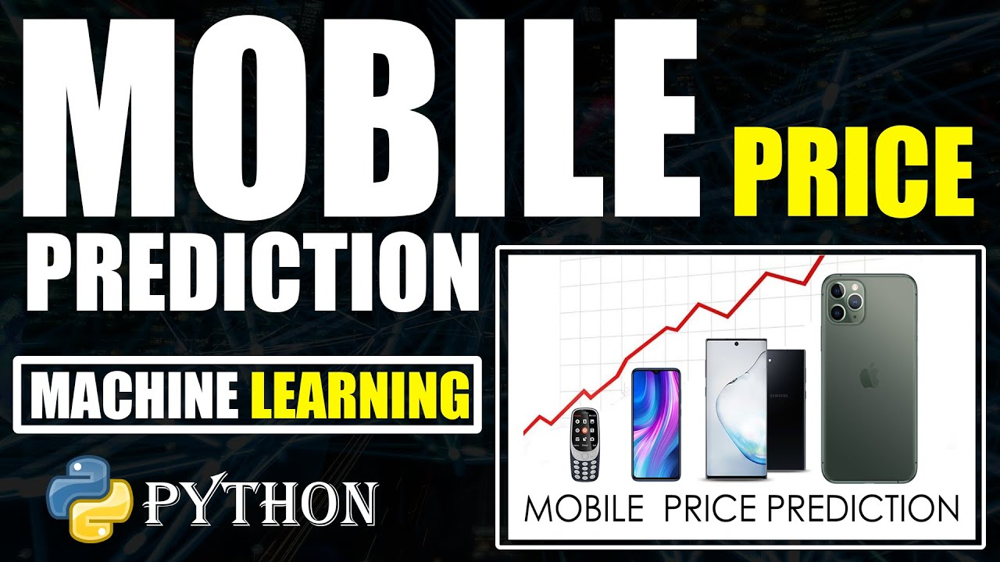

# **Project Name**    -  MOBILE PRICE RANGE PREDICTION



##### **Project Type**    - Classification
##### **Contribution**    - Individual
##### **NAME** - RIPAN KHAN

# **Project Summary -**

Data Preprocessing : 
1. Getting the dataset
2. Importing libraries
3. Importing datasets
4. Finding Missing Data
5. Encoding Categorical Data
6.Data Cleaning and Feature Engineering

Exploratory data analysis : 

1.Firstly Checked correlation between Each Features in dataset.

2.checked if bluetooth available or not???

3.Checked can Battery Power be affected in mobile Price?? and how the battery mAh is spread

4.Checked can Ram, Screen Height  ,Screen width,pixel Height ,pixel width be affected in mobile Price??

5.Checked can 4G and 3G be affected in mobile Price??

Supervise Machine learning algorithms and implementation :

1.Logistic regression

2.Random forest classifier

3.XG Boost

4.SVM

# **GitHub Link -**

https://github.com/Rik1995/mobile-price-range-prediction

# **Problem Statement**


In the competitive mobile phone market companies want to understand sales data of mobile phones and factors which drive the prices. The objective is to find out some relation between features of a mobile phone(eg:- RAM, Internal Memory, etc) and its selling price. In this problem, we do not have to predict the actual price but a price range indicating how high the price is.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [160]:
# Import Libraries
# Import Libraries
import numpy as np
import pandas as pd
from numpy import math
from pandas import datetime as dt
import datetime
import missingno as msno

# Importing Libraries For Data Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy.stats import norm
from scipy import stats

# Importing Libraries For ML Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.metrics import accuracy_score, classification_report, plot_confusion_matrix,confusion_matrix,roc_curve,roc_auc_score,auc,precision_score, recall_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
# Ignoring warnings
import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [161]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [162]:
# Load Dataset
df=pd.read_csv('/content/drive/MyDrive/classification project/data_mobile_price_range.csv')

### Dataset First View

In [163]:
# Dataset First Look
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


### Dataset Rows & Columns count

In [164]:
# Dataset Rows & Columns count
print(df.shape)
print('Number of rows are:',df.shape[0])
print('Number of columns are:',df.shape[1])

(2000, 21)
Number of rows are: 2000
Number of columns are: 21


### Dataset Information

In [165]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

#### Duplicate Values

In [166]:
# Dataset Duplicate Value Count
len(df[df.duplicated()])

0

#### Missing Values/Null Values

In [167]:
# Missing Values/Null Values Count
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

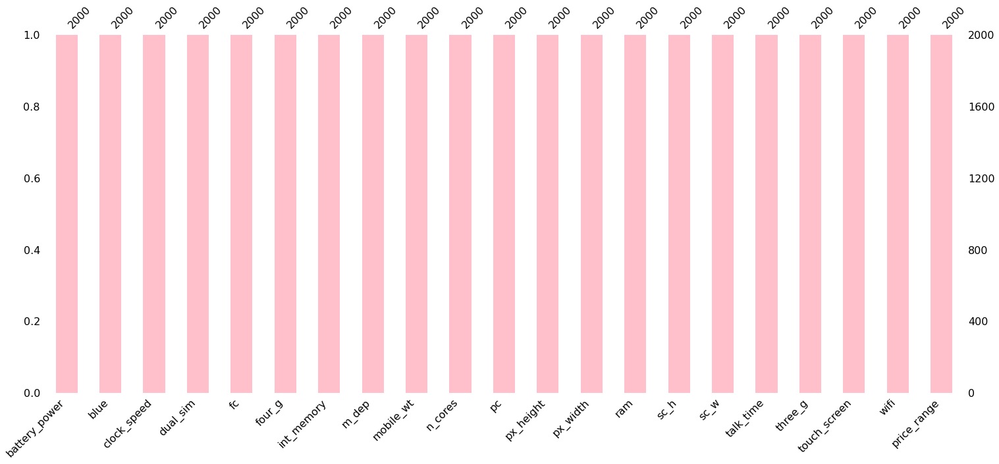

In [168]:
# Visualizing the missing values
msno.bar(df,color='pink')

### What did you know about your dataset?

There are no duplicate values or null values in the dataset.

## ***2. Understanding Your Variables***

In [169]:
# Dataset Columns
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [170]:
# Dataset Describe
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


### Variables Description 

Battery_power - Total energy a battery can store in one time measured in mAh

Blue - Has bluetooth or not

Clock_speed - speed at which microprocessor executes instructions

Dual_sim - Has dual sim support or not

Fc - Front Camera mega pixels

Four_g - Has 4G or not

Int_memory - Internal Memory in Gigabytes

M_dep - Mobile Depth in cm

Mobile_wt - Weight of mobile phone

N_cores - Number of cores of processor

Pc - Primary Camera mega pixels

Px_height - Pixel Resolution Height

Px_width - Pixel Resolution Width

Ram - Random Access Memory in Mega Bytes

Sc_h - Screen Height of mobile in cm

Sc_w - Screen Width of mobile in cm

Talk_time - longest time that a single battery charge will last when you are

Three_g - Has 3G or not

Touch_screen - Has touch screen or not

Wifi - Has wifi or not

Price_range - This is the target variable with value of
0(low cost),
1(medium cost),
2(high cost) and
3(very high cost).

### Check Unique Values for each variable.

In [171]:
# Check Unique Values for each variable.
variables_df=list(df.columns)
for i in variables_df:
  print('the unique values of',i,'are:',df[i].unique())

the unique values of battery_power are: [ 842 1021  563 ... 1139 1467  858]
the unique values of blue are: [0 1]
the unique values of clock_speed are: [2.2 0.5 2.5 1.2 1.7 0.6 2.9 2.8 2.1 1.  0.9 1.1 2.6 1.4 1.6 2.7 1.3 2.3
 2.  1.8 3.  1.5 1.9 2.4 0.8 0.7]
the unique values of dual_sim are: [0 1]
the unique values of fc are: [ 1  0  2 13  3  4  5  7 11 12 16  6 15  8  9 10 18 17 14 19]
the unique values of four_g are: [0 1]
the unique values of int_memory are: [ 7 53 41 10 44 22 24  9 33 17 52 46 13 23 49 19 39 47 38  8 57 51 21  5
 60 61  6 11 50 34 20 27 42 40 64 14 63 43 16 48 12 55 36 30 45 29 58 25
  3 54 15 37 31 32  4 18  2 56 26 35 59 28 62]
the unique values of m_dep are: [0.6 0.7 0.9 0.8 0.1 0.5 1.  0.3 0.4 0.2]
the unique values of mobile_wt are: [188 136 145 131 141 164 139 187 174  93 182 177 159 198 185 196 121 101
  81 156 199 114 111 132 143  96 200  88 150 107 100 157 160 119  87 152
 166 110 118 162 127 109 102 104 148 180 128 134 144 168 155 165  80 138
 142  90 197

## 3. ***Data Wrangling***

### Data Wrangling Code

In [172]:
# Write your code to make your dataset analysis ready.
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [173]:
df.dtypes

battery_power      int64
blue               int64
clock_speed      float64
dual_sim           int64
fc                 int64
four_g             int64
int_memory         int64
m_dep            float64
mobile_wt          int64
n_cores            int64
pc                 int64
px_height          int64
px_width           int64
ram                int64
sc_h               int64
sc_w               int64
talk_time          int64
three_g            int64
touch_screen       int64
wifi               int64
price_range        int64
dtype: object

In [174]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


### we can see there are two variable 'px_height' and 'sc_w' having minimum values as 0 which is not possible in any mobile

In [175]:
# lets see how many observations have 'px_height'=0
df[df['px_height']==0]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1481,1834,0,2.1,0,7,1,40,0.1,99,4,...,0,1987,3692,13,0,16,1,1,0,3
1933,897,1,2.0,0,3,1,2,0.6,154,8,...,0,994,1958,7,5,7,1,1,0,1


In [176]:
# there are only 2 observation which have 'px_height'=0 so we will drop them.
df=df[df['px_height'] != 0] 

In [177]:
df.shape

(1998, 21)

In [178]:
# Checking How many observations having screen width value as 0.
df[df['sc_w']==0].shape[0]

179

## Nearest Neighbors Imputations (KNN Imputer)

Missing values are imputed using the k-Nearest Neighbors approach where a Euclidean distance is used to find the nearest neighbors.

Let’s take the above example of the titanic dataset to see how it works.
* Before using KNN Imputer we need to replace 0 with NAN values. so that it will work.

In [179]:
# Replacing 0 with NAN so that we can implement KNN Imputer.
df['sc_w']=df['sc_w'].replace(0,np.nan)

In [180]:
# import KNN imputer frio sklearn
from sklearn.impute import KNNImputer
impute_knn = KNNImputer(n_neighbors=1)
df=pd.DataFrame(impute_knn.fit_transform(df),columns=df.columns)

In [181]:
# Checking How many observations having sc_w value as 0
df[df['sc_w']==0].shape[0]

0

In [182]:
df.shape

(1998, 21)

##**So the mismatch data has been handled**

In [183]:
#creating list of numerical and categorical columns
numerical_columns=[]
for col in df.columns:
  if df[col].nunique()>5:
    numerical_columns.append(col)
categorical_columns=list(set(df.columns)-set(numerical_columns))

In [184]:
print(numerical_columns)

['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']


In [185]:
print(categorical_columns)

['dual_sim', 'three_g', 'blue', 'touch_screen', 'wifi', 'price_range', 'four_g']


### What all manipulations have you done and insights you found?

 Two variable 'px_height' and 'sc_w' were having minimum values as 0 which was not possible so i have handled the mismatch data using knn imputer and also created two separate list of numerical and categorical column

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

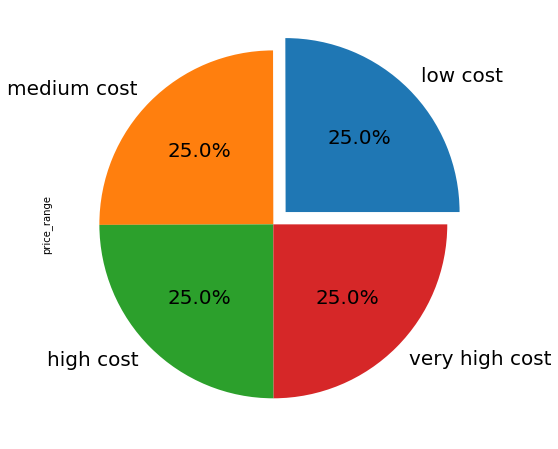

In [186]:
# Chart - 1 visualization code 
# lets have look at our target variable's counts
labels=["low cost", "medium cost", "high cost", "very high cost"]
explode=[0.1,0,0,0]
df['price_range'].value_counts().plot.pie(explode=explode,labels=labels,figsize=(12,8),fontsize=20,autopct='%1.1f%%')
plt.show()


##### 1. Why did you pick the specific chart?

Pie Chart is Best used to show the composition of a whole, where each component is a part of the whole. We are using pie chart here to see how the target variable 'price_range' is distributed.

##### 2. What is/are the insight(s) found from the chart?

We can see that our target varibale is equally distributed.
Thus we don't have to worry about data imbalance.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.It will help to gain insight to help creating a positive business impact.

#### Chart - 2

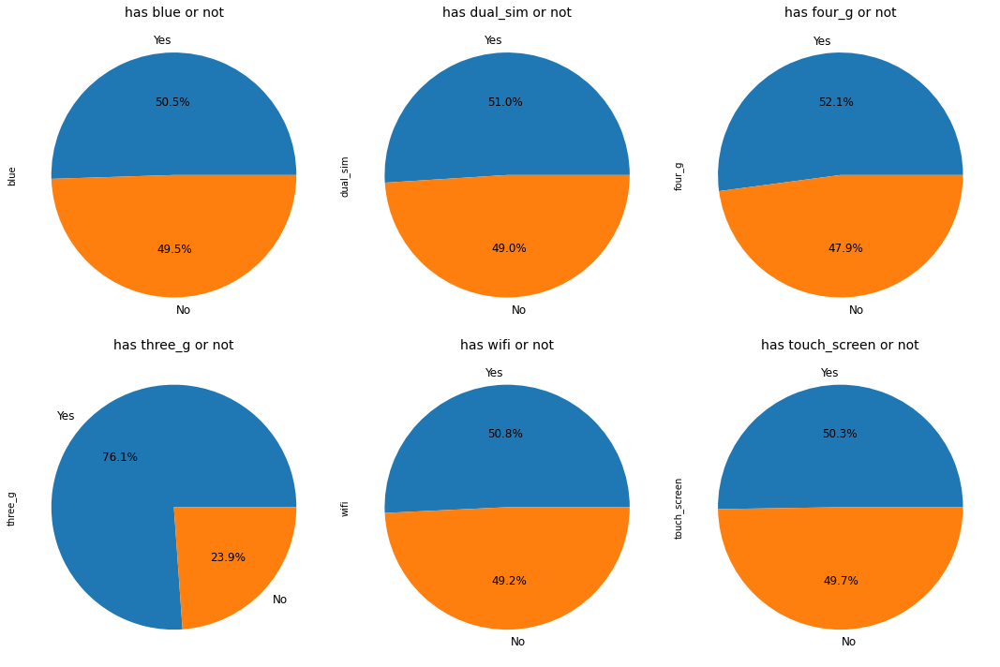

In [187]:
# Chart - 2 visualization code
# Plotting the piecharts of binary categorical variables for Univariate analysis.
plt.figure(figsize=(15,10))
rows=2
col=3
count=1
var_list=['blue','dual_sim','four_g','three_g','wifi','touch_screen']
label=['Yes','No']
for var in var_list:
  plt.subplot(rows,col,count)
  df[var].value_counts().plot.pie(autopct='%1.1f%%',fontsize=12,labels=label)
  plt.title(f'has {var} or not',fontsize=14)
  plt.tight_layout()
  count=count+1

##### 1. Why did you pick the specific chart?

Pie Chart is Best used to show the composition of a whole, where each component is a part of the whole.

##### 2. What is/are the insight(s) found from the chart?

* Percentage Distribution of Mobiles having bluetooth,dual sim, 4G,wifi and touchscreen are almost 50%.

* very few mobiles(23.8%) do not have Three_g.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.It will help to gain insight to help creating a positive business impact.

#### Chart - 3

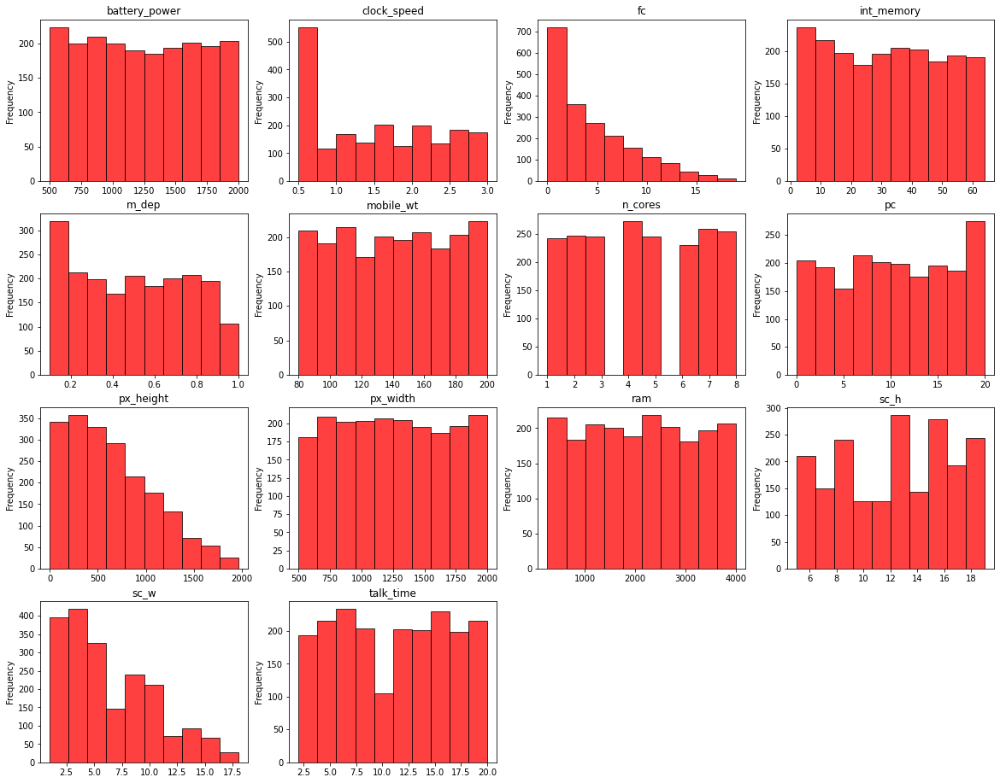

In [188]:
# Chart - 3 visualization code
# lets see the histograms of the numerical variables
plt.figure(figsize=(20,16))
rows=4
col=4
count=1
var_list=['battery_power','clock_speed','fc','int_memory','m_dep','mobile_wt','n_cores','pc','px_height','px_width','ram','sc_h','sc_w','talk_time']
for var in var_list:
  plt.subplot(rows,col,count)
  df[var].plot.hist(bins=10,color='red', edgecolor='black', alpha=0.75)
  plt.title(var)
  count=count+1

##### 1. Why did you pick the specific chart?

A histogram provides a visual representation of the distribution of a dataset. It shows how the data is spread out, whether it is evenly distributed or skewed in one direction. This information can be useful in identifying patterns, trends in the data.

##### 2. What is/are the insight(s) found from the chart?

* battery power of the mobiles are evenly distributed.
* most of the mobiles have clock speed under 1 GHz.
* most of the mobiles have front camera of 5 mp or less.
* most of the mobiles have pixels height under 500.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.It will help to gain insight to help creating a positive business impact.

#### Chart - 4

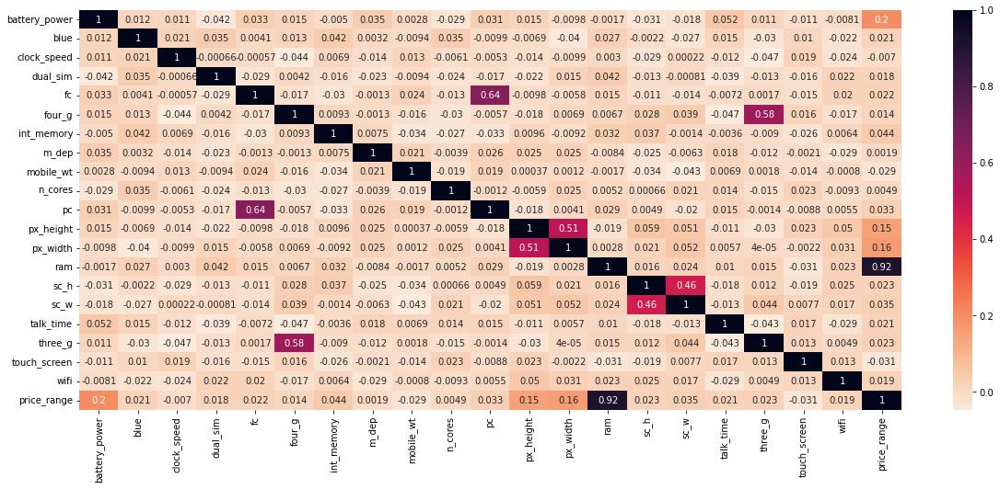

In [189]:
# Chart - 4 visualization code
# Chart - 4 visualization code
# lets check the correlation heatmap
plt.figure(figsize = [20,8])
sns.heatmap(df.corr(),cmap = 'rocket_r',annot=True)

##### 1. Why did you pick the specific chart?

To check the Correlation of the target varaible i.e Dependent variable with the other independent variable.

##### 2. What is/are the insight(s) found from the chart?

* RAM has strong positive correlation with the Price_range. and we know that Mobiles with high RAM are very costly. Thus RAM increases price range also increase.

* Battery_power also has positive correlation with the price range.Generally mobiles having high prices comes with good battery power.

* Also px_height and px_width (Pixel Resolution Height and width) are positively correlated. Generally High price range mobiles have good resolutions.

* Four_g and Three_g are highly positvely correlated. Nowdays most of the smart mobiles has both type of options. This could be the reason that they are correlated.

* primary camera i.e pc and front camera fc are positively correlated.

* sc_h and sc_w are positively correlated.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.It will help to gain insight to help creating a positive business impact.

#### Chart - 5

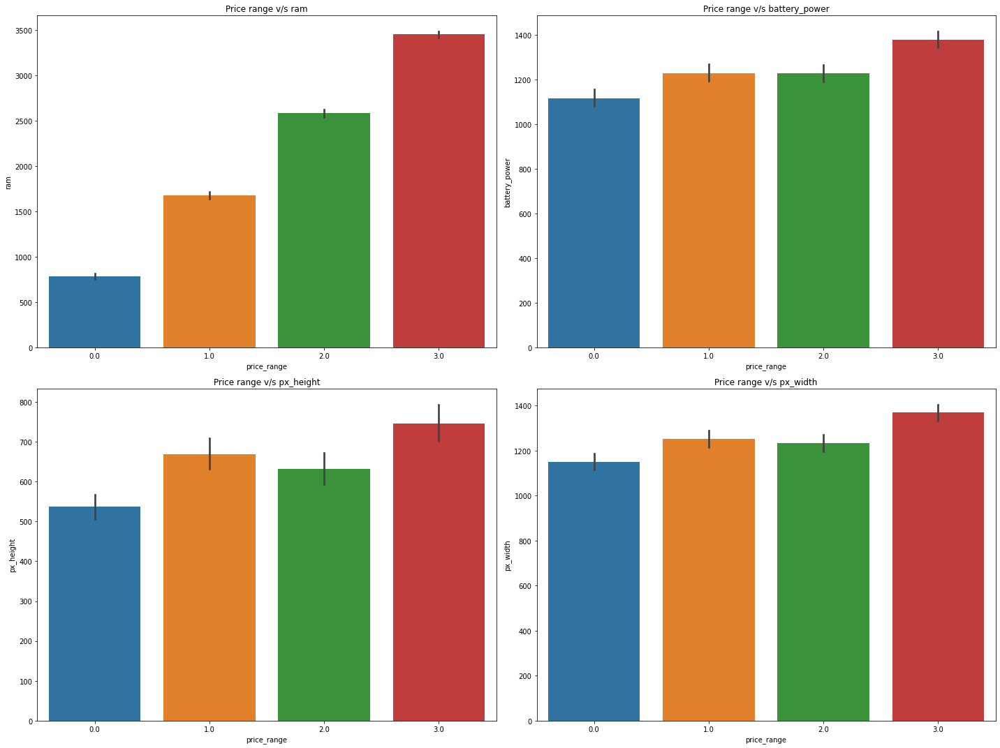

In [190]:
# Chart - 5 visualization code
# plotting  price_range vs 'ram','battery_power','px_height,'px_width'
plt.figure(figsize=(20,15))

labels=['0=low_cost','1=medium_cost','2=high_cost','3=very_high_cost']

rows=2 
cols=2
counter=1

variables=['ram','battery_power','px_height','px_width']

for var in variables:
  plt.subplot(rows,cols,counter)
  sns.barplot(x=df['price_range'],y=df[var])
  plt.title(f'Price range v/s {var}')
  counter=counter+1
  plt.tight_layout()

##### 1. Why did you pick the specific chart?

Bar plots are a versatile and powerful tool for data visualization, as they provide a simple and effective way to compare the values of different categories or groups 

##### 2. What is/are the insight(s) found from the chart?

* As Price range increases ram also increases.
* Mobiles having RAM less than 1000 MB falls under low cost category.
* Mobiles with battery power more than 1300 mAh has very high cost. And Mobiles with battery power between 1200 and 1300 mAH falls under medium and high cost category.
* Mobiles with more than 700 pixel height and width more than 1300 has very high cost.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.It will help to gain insight to help creating a positive business impact.

#### Chart - 6

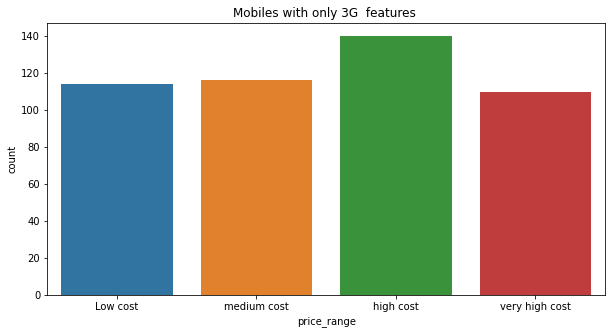

In [191]:
# Chart - 6 visualization code
# lets see how the 3g connectivity effects the price range
three_g_df=df[(df['three_g']==1) & (df['four_g']!=1)]
plt.figure(figsize=(10,5))
sns.countplot(three_g_df['price_range'])
plt.xticks(ticks=[0,1,2,3],labels=['Low cost','medium cost','high cost','very high cost'])
plt.title("Mobiles with only 3G  features ")
plt.show()

##### 1. Why did you pick the specific chart?

Countplots are an effective and useful tool for visualizing categorical data and understanding the frequency of occurrences of different categories. They are simple, intuitive, and provide a clear and concise way to compare the frequencies of different categories in a dataset.

##### 2. What is/are the insight(s) found from the chart?

* Mobiles which has very high cost are very less likely to have 3G.
* There are more chances that high cost mobile will have 3G in it.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.It will help to gain insight to help creating a positive business impact.

#### Chart - 7

<Figure size 1152x864 with 0 Axes>

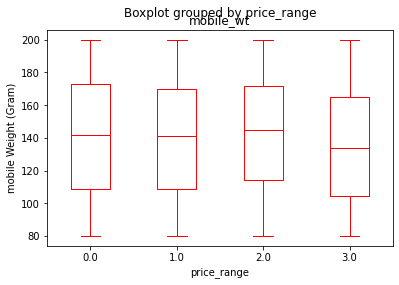

In [192]:
# Chart - 7 visualization code
plt.figure(figsize=(16,12))
df.boxplot(by ='price_range', column =['mobile_wt'], grid = False,color='red'),
plt.ylabel("mobile Weight (Gram)")
plt.show()

##### 1. Why did you pick the specific chart?

Box plots can be used to compare the distributions of different datasets. This can be useful in identifying similarities and differences between groups of data.

##### 2. What is/are the insight(s) found from the chart?

As we can see in the boxplot very high costly mobiles are more light weight than other mobiles

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.It will help to gain insight to help creating a positive business impact.

#### Chart - 8

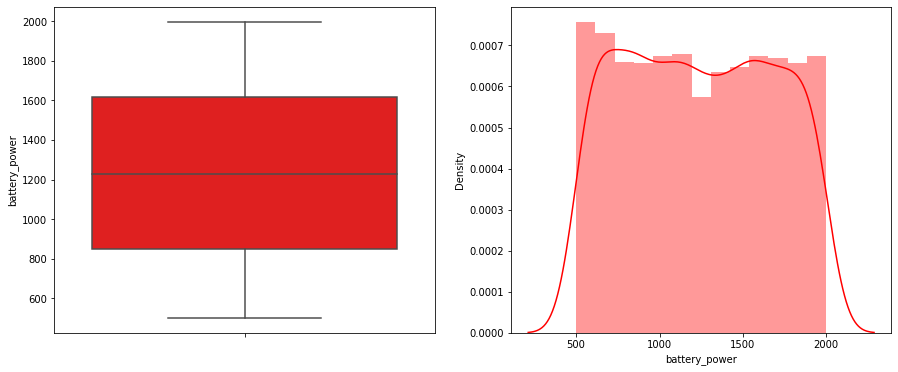

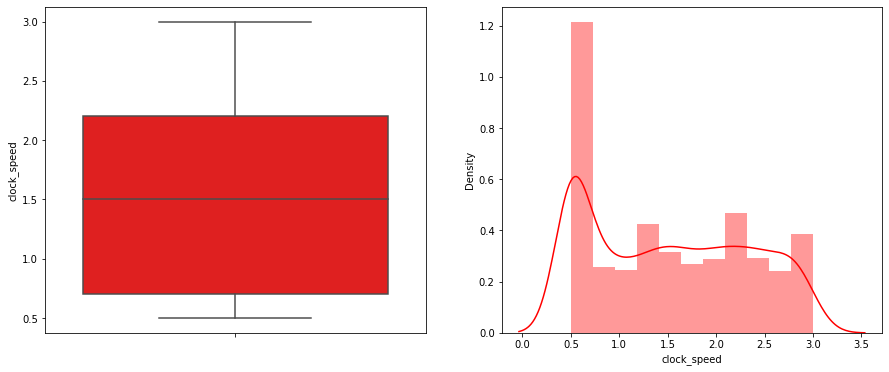

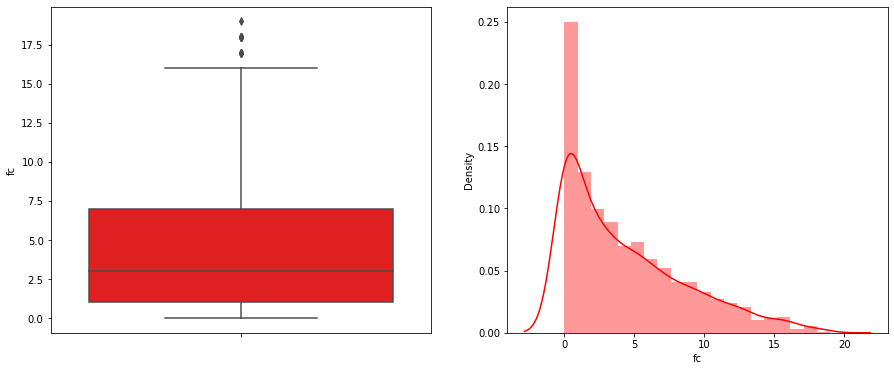

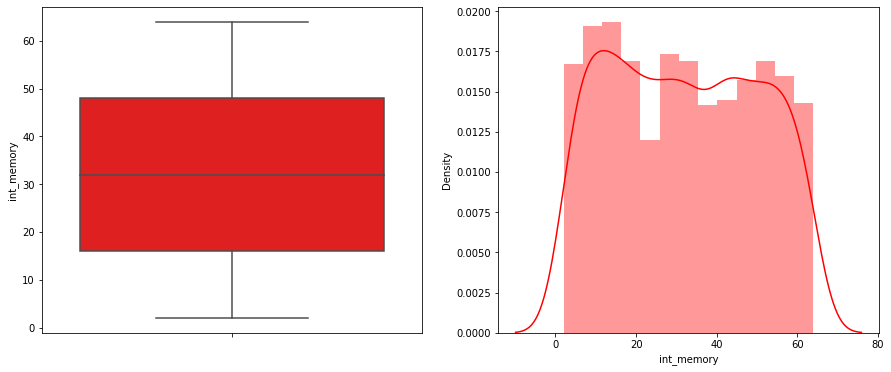

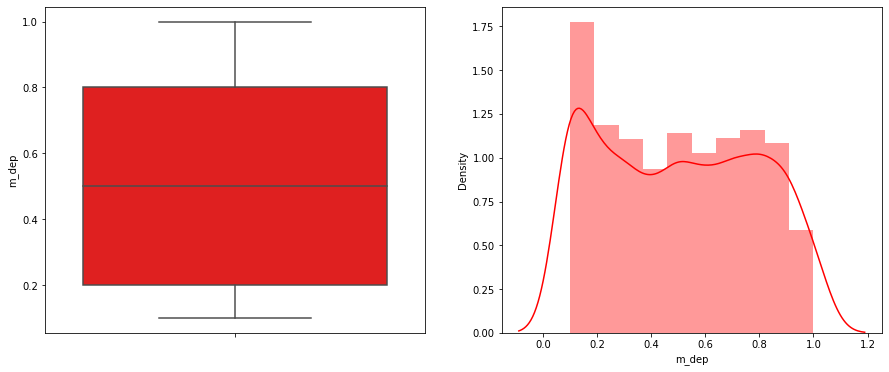

...

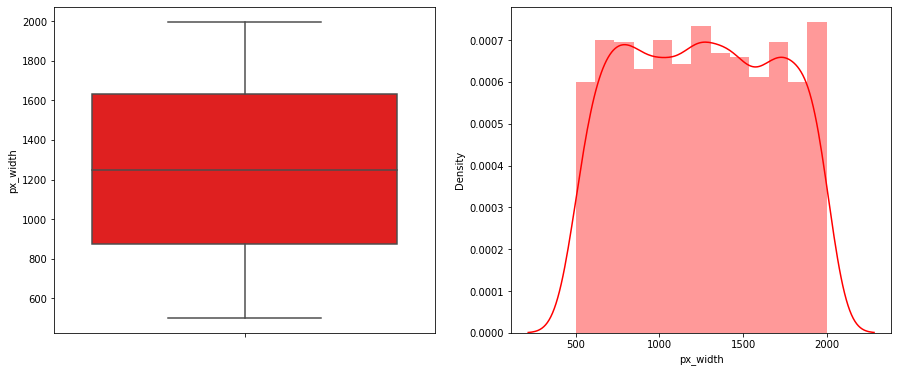

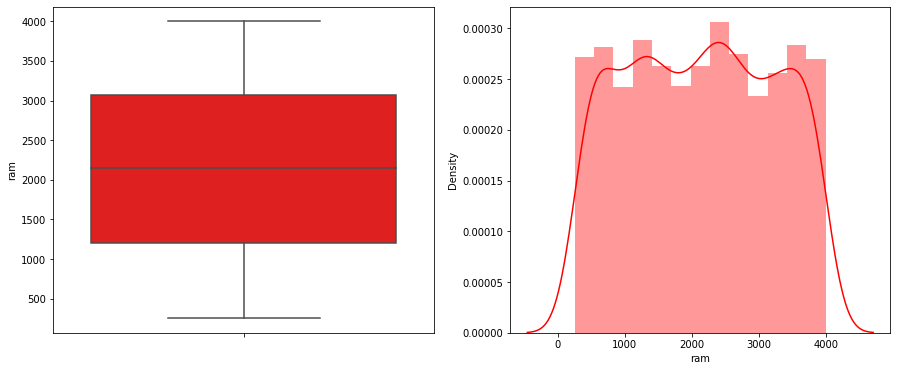

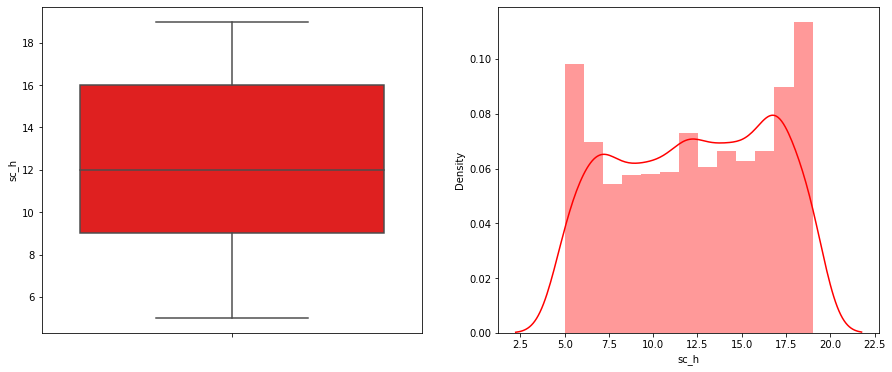

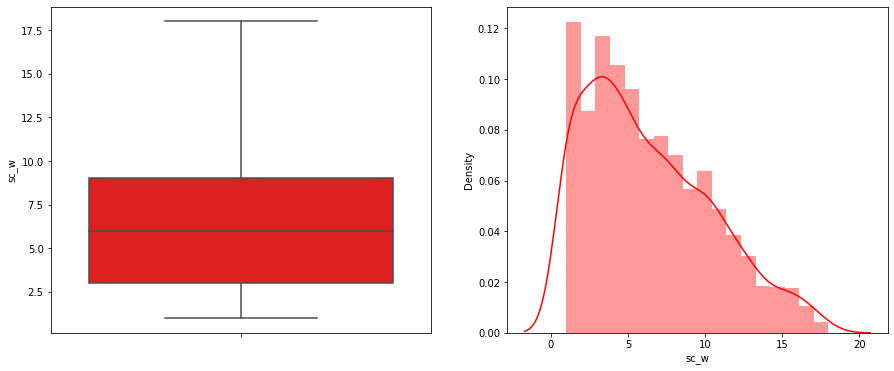

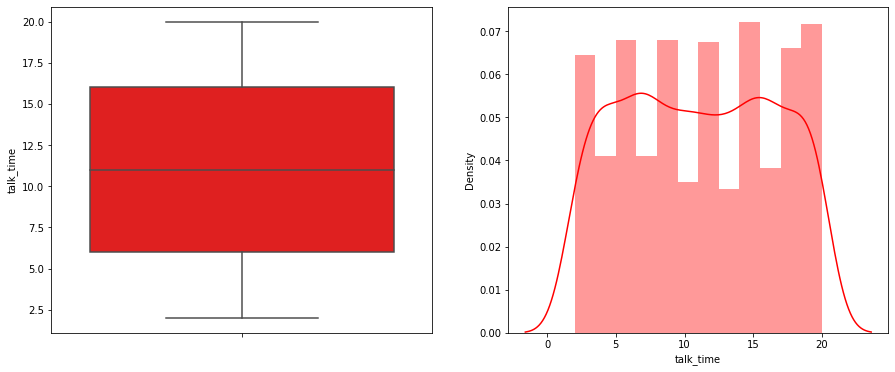

In [193]:
# Chart - 8 visualization code
# plotting boXplot and distribution
for var in numerical_columns:
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    fig = sns.boxplot(y=df[var],color='red')
    fig.set_title('')
    fig.set_ylabel(var)
    plt.subplot(1, 2, 2)
    fig = sns.distplot(df[var],color='red')
    fig.set_xlabel(var)
    plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

* Data is well distrubted.
* fc and px_height has some outliers.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 9 - Correlation Heatmap

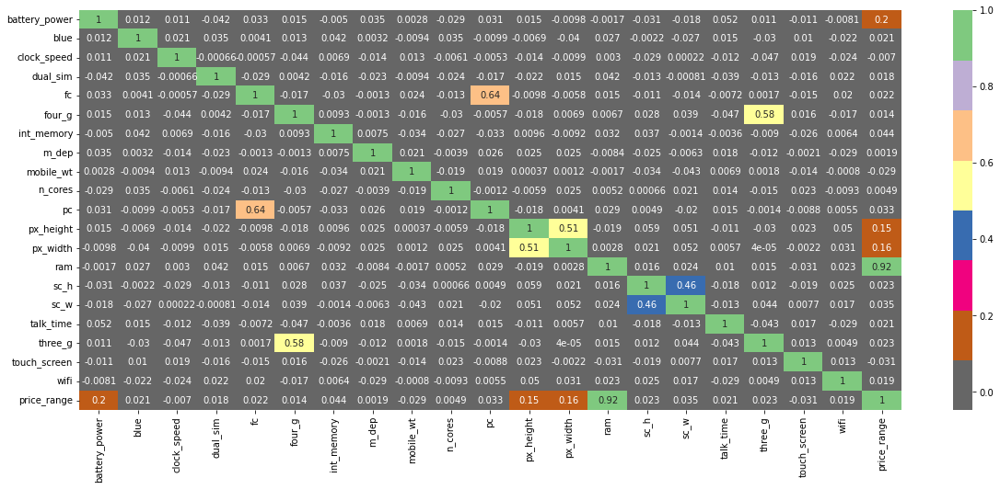

In [194]:
# Correlation Heatmap visualization code
plt.figure(figsize = [20,8])
sns.heatmap(df.corr(),annot=True, cmap=plt.cm.Accent_r)

##### 1. Why did you pick the specific chart?

previously discussed. 

##### 2. What is/are the insight(s) found from the chart?

previously discussed.

#### Chart - 10 - Pair Plot 

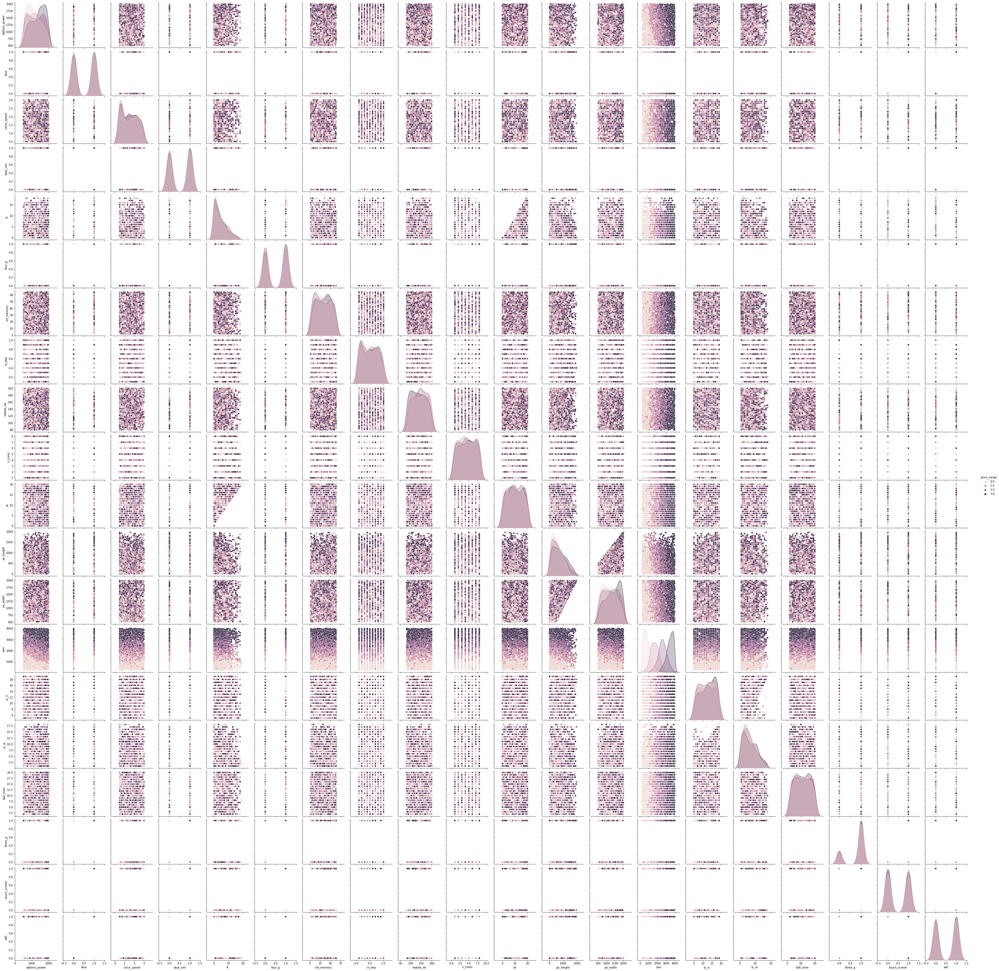

In [195]:
# Pair Plot visualization code
sns.pairplot(df, hue="price_range")

##### 1. Why did you pick the specific chart?

Pairplots are an effective and useful tool for multivariate analysis and for visualizing and exploring the structure of a dataset. They provide a clear and concise way to visualize the relationships between variables and to identify patterns, trends, and correlations in the data.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [196]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [197]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Answer Here.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

##### Which statistical test have you done to obtain P-Value?

Answer Here.

##### Why did you choose the specific statistical test?

Answer Here.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [198]:
# Handling Missing Values & Missing Value Imputation
# there were no missing values

#### What all missing value imputation techniques have you used and why did you use those techniques?

Answer Here.

### 2. Handling Outliers

In [200]:
# Handling Outliers & Outlier treatments
# as seen earlier 'fc' and 'px_height' have some outliers
Q1 = df["fc"].quantile(0.25)
Q3 = df['fc'].quantile(0.991)
IQR = Q3-Q1

# Outliers are present after Quartile 3. so we will take datapoints before Q3.
df = df[(df['fc'] <= Q3)]

In [201]:
Q1 = df["px_height"].quantile(0.25)
Q3 = df['px_height'].quantile(0.991)
IQR = Q3-Q1
# Outliers are present after Quartile 3. so we will take datapoints before Q3.
df = df[(df['px_height'] <= Q3)]

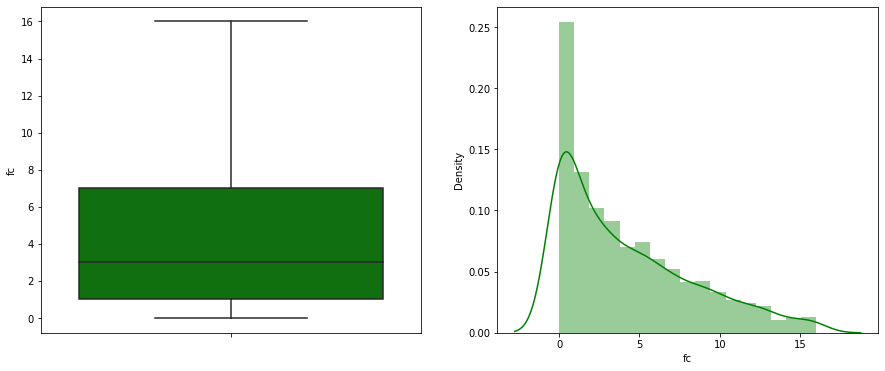

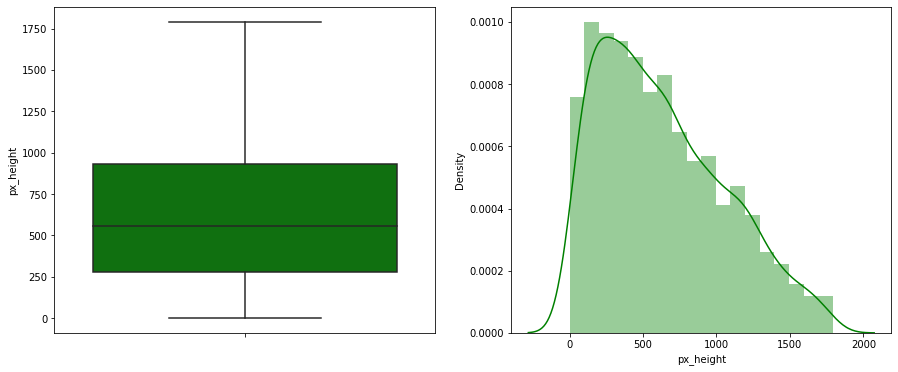

In [202]:
# Visualising whether oultliers are removed or not.
for var in ['fc','px_height']:
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    fig = sns.boxplot(y=df[var],color='green')
    fig.set_title('')
    fig.set_ylabel(var)
    plt.subplot(1, 2, 2)
    fig = sns.distplot(df[var],color='green')
    fig.set_xlabel(var)
    plt.show()

* Now there are no outliers present in the dataset

##### What all outlier treatment techniques have you used and why did you use those techniques?

* We use the Winsorization technique to replace the outliers with the appropriate quantile value.
* The Winsorization technique provides a way to reduce the impact of outliers on the analysis without removing the outliers entirely. By replacing the outliers with more representative values, the Winsorization technique helps to minimize the impact of outliers on the results of statistical analysis.

### 3. Categorical Encoding

In [203]:
# Encode your categorical columns
# already done

#### What all categorical encoding techniques have you used & why did you use those techniques?

Answer Here.

### 4. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction

In [ ]:
# Expand Contraction

#### 2. Lower Casing

In [ ]:
# Lower Casing

#### 3. Removing Punctuations

In [ ]:
# Remove Punctuations

#### 4. Removing URLs & Removing words and digits contain digits.

In [ ]:
# Remove URLs & Remove words and digits contain digits

#### 5. Removing Stopwords & Removing White spaces

In [ ]:
# Remove Stopwords

In [ ]:
# Remove White spaces

#### 6. Rephrase Text

In [ ]:
# Rephrase Text

#### 7. Tokenization

In [ ]:
# Tokenization

#### 8. Text Normalization

In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)

##### Which text normalization technique have you used and why?

Answer Here.

#### 9. Part of speech tagging

In [ ]:
# POS Taging

#### 10. Text Vectorization

In [ ]:
# Vectorizing Text

##### Which text vectorization technique have you used and why?

Answer Here.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [205]:
# Manipulate Features to minimize feature correlation and create new features
# create copy of mobile_data
new_df=df.copy()

In [206]:
# create new colom screen size and pixels
df['screen_size']= round(np.sqrt(df['sc_h']**2+df['sc_w']**2)/2.54,2)
df['Pixels']=df['px_height']*df['px_width']
#dropping excess columns
df.drop(columns=["sc_h",'sc_w','px_height','px_width'],axis=1,inplace=True)

#### 2. Feature Selection

In [207]:
# Select your features wisely to avoid overfitting
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [208]:
# Separating X variables(indpendent variables) and Y(dependent variable) variable.
X=df.drop('price_range',axis=1)
y=df["price_range"]

In [209]:
#No we Will select the  top 12 important features
bestfeatures = SelectKBest(score_func=chi2, k=12)
fit = bestfeatures.fit(X,y)
# creating score's and coolumn's dataframe
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
# conacatenating above two dataframes
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']
# Check dataframe
featureScores

,Specs,Score
0,battery_power,1.327686e+04
1,blue,6.251684e-01
2,clock_speed,8.302129e-01
3,dual_sim,7.367622e-01
4,fc,1.086719e+01
5,four_g,1.319605e+00
6,int_memory,7.835770e+01
7,m_dep,7.973506e-01
8,mobile_wt,8.702756e+01
9,n_cores,8.395937e+00


In [210]:
# 12 features with highest chi squared statistic 
print(featureScores.nlargest(12,'Score'))

            Specs         Score
17         Pixels  5.156599e+07
11            ram  9.149714e+05
0   battery_power  1.327686e+04
8       mobile_wt  8.702756e+01
6      int_memory  7.835770e+01
12      talk_time  1.146077e+01
4              fc  1.086719e+01
9         n_cores  8.395937e+00
10             pc  7.639203e+00
16    screen_size  5.888692e+00
14   touch_screen  2.344057e+00
5          four_g  1.319605e+00


In [211]:
from pandas.io.formats.info import DataFrameInfo
# 12 features with highest chi squared statistic are selected as independent variables.
X=df[['ram','Pixels','battery_power','mobile_wt','int_memory','screen_size','talk_time','fc','n_cores','pc','touch_screen','four_g']]

# dependent varaible
y=df['price_range']

##### What all feature selection methods have you used  and why?

I have used the chi squared statistics to get the 12 most important features

##### Which all features you found important and why?

I have found 12 important features according to the chi squared statistics which are 'ram','Pixels','battery_power','mobile_wt','int_memory','screen_size','talk_time','fc','n_cores','pc','touch_screen','four_g'.

### 5. Data Transformation

In [131]:
# splitting the data into Train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(1569, 12)
(393, 12)
(1569,)
(393,)


### 6. Data Scaling

In [132]:
# Scaling your data
# creating an object of MinMax Scaler
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)   # fitting the X_train
X_test_scaled=scaler.transform(X_test)         # transforming X_test

##### Which method have you used to scale you data and why?

### 8. Data Splitting

##### What data splitting ratio have you used and why? 

I have used 80% data for training and 20% data for testing. As this ration gives the best result.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [212]:
# Handling Imbalanced Dataset (If needed)
# already done

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

### ML Model - 1  
### Logistic regression

In [59]:
# ML Model - 1 Implementation
lrc=LogisticRegression()
# Fit the Algorithm
lrc.fit(X_train_scaled,y_train)
# Predict on the model
y_train_pred=lrc.predict(X_train_scaled)
y_pred=lrc.predict(X_test_scaled)

In [41]:
# Checking train set accuracy.
accuracy_score(y_train,y_train_pred)

0.9413639260675589

In [42]:
# Checking test set accuracy
accuracy_score(y_test,y_pred)

0.9541984732824428

In [43]:
# Confusion matrix for test set.
cf_matrix=confusion_matrix(y_test,y_pred)
cf_matrix

array([[100,   1,   0,   0],
       [  2,  98,   4,   0],
       [  0,   2,  84,   5],
       [  0,   0,   4,  93]])

In [44]:
# creating a class list
Class_cat = ['low cost','medium cost', 'high cost', 'very high cost']

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

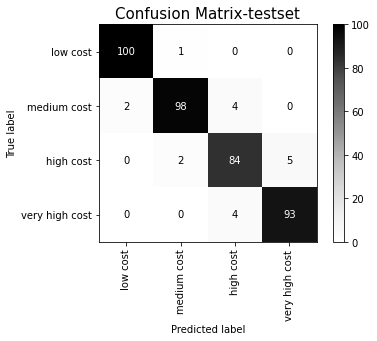

In [45]:
# plotting confusion matrix for test set.
plot_confusion_matrix(lrc,X_test_scaled,y_test,cmap='Greys',display_labels=Class_cat,xticks_rotation='vertical')
plt.grid(False)
plt.title('Confusion Matrix-testset',fontsize=15)
plt.show()

In [46]:
# Printing classification of train set.
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

         0.0       0.97      0.97      0.97       393
         1.0       0.92      0.93      0.92       387
         2.0       0.92      0.91      0.91       400
         3.0       0.96      0.96      0.96       389

    accuracy                           0.94      1569
   macro avg       0.94      0.94      0.94      1569
weighted avg       0.94      0.94      0.94      1569



In [47]:
# printing classification of test set.
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99       101
         1.0       0.97      0.94      0.96       104
         2.0       0.91      0.92      0.92        91
         3.0       0.95      0.96      0.95        97

    accuracy                           0.95       393
   macro avg       0.95      0.95      0.95       393
weighted avg       0.95      0.95      0.95       393



* ***Train set accuracy is 94% and test accuracy is 95%.***
* ***Model is fitted well on train set and also performed well on the test set.***

#### ML MODEL 2
#### Random Forest

In [77]:
# ML Model - 2 Implementation
# splitting the data into trainset and test set.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

In [79]:
# creating an object of the classifier.
rfc=RandomForestClassifier(random_state=0)

In [80]:
# fitting/training the model.
rfc.fit(X_train,y_train)

RandomForestClassifier(random_state=0)

In [81]:
# predicting the y values of train set and test set.
y_train_pred=rfc.predict(X_train)
y_pred=rfc.predict(X_test)

In [82]:
# Checking the accuarcy score of train set.
accuracy_score(y_train,y_train_pred)

1.0

In [83]:
# Checking the accuracy score of test set.
accuracy_score(y_test,y_pred)

0.8655804480651731

In [84]:
# Confusion matrix for test set.
cf_matrix=confusion_matrix(y_test,y_pred)
cf_matrix

array([[128,  10,   0,   0],
       [ 10,  94,  11,   0],
       [  0,  16,  98,   5],
       [  0,   0,  14, 105]])

In [85]:
# creating a class list
Class_cat = ['low cost','medium cost', 'high cost', 'very high cost']

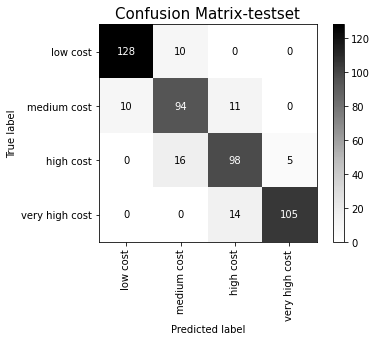

In [86]:
# plotting confusion matrix for test set.
plot_confusion_matrix(rfc,X_test,y_test,cmap='Greys',display_labels=Class_cat,xticks_rotation='vertical')
plt.grid(False)
plt.title('Confusion Matrix-testset',fontsize=15)
plt.show()

In [87]:
# printing the classification report for train set.
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       356
         1.0       1.00      1.00      1.00       376
         2.0       1.00      1.00      1.00       372
         3.0       1.00      1.00      1.00       367

    accuracy                           1.00      1471
   macro avg       1.00      1.00      1.00      1471
weighted avg       1.00      1.00      1.00      1471



In [88]:
# printing the classification report for train set.
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93       138
         1.0       0.78      0.82      0.80       115
         2.0       0.80      0.82      0.81       119
         3.0       0.95      0.88      0.92       119

    accuracy                           0.87       491
   macro avg       0.87      0.86      0.86       491
weighted avg       0.87      0.87      0.87       491



* ***Train accuarcy is 100% and test accuracy is 86%. which is quite good. But model seems to be overfitted and has not generalised the data well. We need to reduce overfitting and improve the model performance.***
* ***we do some hyperparameter tunning to reduce overfitting***

#### 2. Cross- Validation & Hyperparameter Tuning

In [89]:
# para_grid values to pass in gridsearchcv.
grid_values={'n_estimators':[300, 400, 500, 700],
          'max_depth':[None, 10, 20, 40],
          'min_samples_split':[2,6,10],
          'max_leaf_nodes':[None],
          'criterion':['entropy','gini'],
          'max_features':['auto','log2','sqrt']
          
             }

In [90]:
# creating the instance 
rfc_= RandomForestClassifier(random_state=0)

In [91]:
# Applying GridSearchCV
rfc_tune=GridSearchCV(rfc_,param_grid=grid_values,cv=3,verbose=3,scoring='accuracy')
rfc_tune.fit(X_train,y_train)

Fitting 3 folds for each of 288 candidates, totalling 864 fits
[CV 1/3] END criterion=entropy, max_depth=None, max_features=auto, max_leaf_nodes=None, min_samples_split=2, n_estimators=300;, score=0.880 total time=   0.9s
[CV 2/3] END criterion=entropy, max_depth=None, max_features=auto, max_leaf_nodes=None, min_samples_split=2, n_estimators=300;, score=0.878 total time=   0.9s
[CV 3/3] END criterion=entropy, max_depth=None, max_features=auto, max_leaf_nodes=None, min_samples_split=2, n_estimators=300;, score=0.902 total time=   0.9s
[CV 1/3] END criterion=entropy, max_depth=None, max_features=auto, max_leaf_nodes=None, min_samples_split=2, n_estimators=400;, score=0.878 total time=   1.5s
[CV 2/3] END criterion=entropy, max_depth=None, max_features=auto, max_leaf_nodes=None, min_samples_split=2, n_estimators=400;, score=0.878 total time=   1.9s
[CV 3/3] END criterion=entropy, max_depth=None, max_features=auto, max_leaf_nodes=None, min_samples_split=2, n_estimators=400;, score=0.900 to

GridSearchCV(cv=3, estimator=RandomForestClassifier(random_state=0),
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [None, 10, 20, 40],
                         'max_features': ['auto', 'log2', 'sqrt'],
                         'max_leaf_nodes': [None],
                         'min_samples_split': [2, 6, 10],
                         'n_estimators': [300, 400, 500, 700]},
             scoring='accuracy', verbose=3)

In [92]:
#Getting best paramters for the models
rfc_tune.best_params_

{'criterion': 'entropy',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_samples_split': 2,
 'n_estimators': 700}

In [93]:
# fitting/training the data with best parameters.
rfc_optimal=RandomForestClassifier(max_features='auto',criterion='entropy',max_depth=None,max_leaf_nodes=None,min_samples_split=6,n_estimators=700,random_state=0)
rfc_optimal.fit(X_train,y_train)

RandomForestClassifier(criterion='entropy', min_samples_split=6,
                       n_estimators=700, random_state=0)

In [94]:
# predicting y values of train and test set.
y_train_pred=rfc_optimal.predict(X_train)
y_pred=rfc_optimal.predict(X_test)

In [95]:
# checking the train accuracy score.
accuracy_score(y_train,y_train_pred)

1.0

In [96]:
# checking the test accuracy score.
accuracy_score(y_test,y_pred)

0.8778004073319755

In [97]:
# getting confusion matrix
cf_matrix=confusion_matrix(y_test,y_pred)
cf_matrix

array([[128,  10,   0,   0],
       [ 11,  94,  10,   0],
       [  0,  16,  98,   5],
       [  0,   0,   8, 111]])

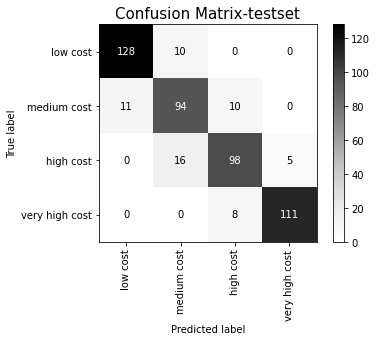

In [98]:
# plotting confusion matrix for test set.
plot_confusion_matrix(rfc_optimal,X_test,y_test,cmap='Greys',display_labels=Class_cat,xticks_rotation='vertical')
plt.grid(False)
plt.title('Confusion Matrix-testset',fontsize=15)
plt.show()

In [99]:
# printing the classification report for train set
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       356
         1.0       1.00      1.00      1.00       376
         2.0       1.00      1.00      1.00       372
         3.0       1.00      1.00      1.00       367

    accuracy                           1.00      1471
   macro avg       1.00      1.00      1.00      1471
weighted avg       1.00      1.00      1.00      1471



In [100]:
# printing the classification report for train set
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.92      0.93      0.92       138
         1.0       0.78      0.82      0.80       115
         2.0       0.84      0.82      0.83       119
         3.0       0.96      0.93      0.94       119

    accuracy                           0.88       491
   macro avg       0.88      0.88      0.88       491
weighted avg       0.88      0.88      0.88       491



In [101]:
# creating a function for plotting the feature importances.
def plot_feature_importance(algo):
  ''' Takes the alogorithm as input and 
  plots the feature importance graph'''
  
  # get importance
  importance = algo.feature_importances_
  feat_importance=pd.DataFrame({'Features':X.columns,'score':importance}).sort_values(by='score',ascending=False)
  plt.figure(figsize=(10,8))
  sns.barplot(x=feat_importance['score'],y=feat_importance['Features'])
  plt.title('Feature Importance')

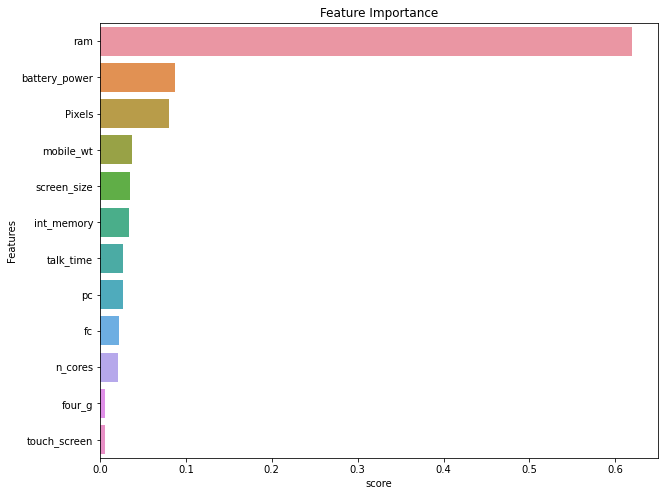

In [102]:
# Visualizing evaluation Metric Score chart
#plotting feature importances
plot_feature_importance(rfc_optimal)

In [103]:
# Defining a fucnction for plotting roc curve
def plot_Auc_roc(y_test,pred_prob):
  '''It will take y_test and y predicted probabilities
  as input and will plot the roc curve.'''

  fpr = {}
  tpr = {}
  thresh ={}

  n_class = 4

  for i in range(n_class):    
      fpr[i], tpr[i], thresh[i] = roc_curve(y_test, pred_prob[:,i], pos_label=i)
      
  # plotting    
  plt.figure(figsize=(12,8))
  plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label= ((f'Class 0(Low cost) vs Rest, AUC= {round(auc(fpr[0],tpr[0]),4)}')))
  plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label=((f'Class 1(Medium cost) vs Rest, AUC= {round(auc(fpr[1],tpr[1]),4)}')))
  plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label=((f'Class 2(High cost) vs Rest, AUC= {round(auc(fpr[2],tpr[2]),4)}')))
  plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label=((f'Class 3(Very High cost) vs Rest, AUC= {round(auc(fpr[3],tpr[3]),4)}')))
  plt.title('Multiclass ROC curve')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive rate')
  plt.legend(loc='best')
  plt.savefig('Multiclass ROC',dpi=300);  

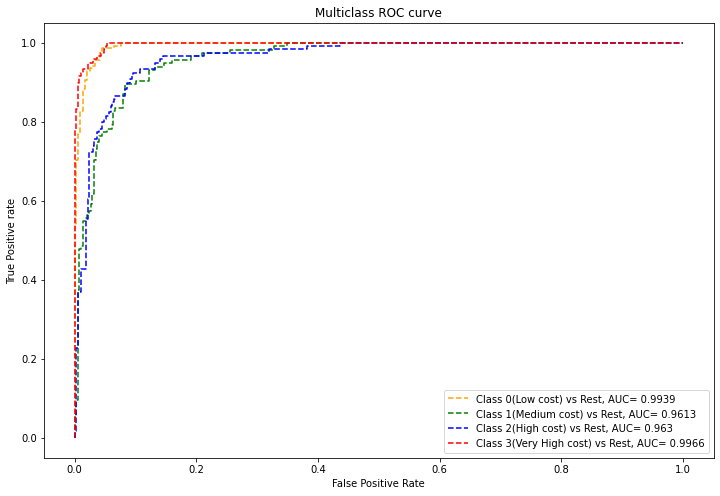

In [104]:
# Plot AUC ROC curve.
pred_prob = rfc_optimal.predict_proba(X_test)
plot_Auc_roc(y_test,pred_prob)

###**Observations of Random Forest:**
***Before Tuning***
* ***training accuarcy = 100%***
* ***test accuarcy = 86.5%***

***Model is overfitted the data and does not generalised well. So we tuned the hyperparameters.***

***After tuning:***
* ***Training accuarcy= 100%***
* ***Test accuarcy = 87.7%***

***we have slightly improved the model and overfitting is reduced slightly.***

***From roc curve its clear that model has poorly performed to classify class 1 and class 2.***

### ML Model - 3

# **XGBoost Classifier:** 

### **With default hyperparameter**

In [108]:
# spltting the data into train test split.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

In [109]:
xgb=XGBClassifier()        # creating an object of the classifier
xgb.fit(X_train,y_train)      # fitting the data 

XGBClassifier(objective='multi:softprob')

In [110]:
# predicting y values of train and test data.
y_train_pred=xgb.predict(X_train)
y_pred=xgb.predict(X_test)

In [111]:
# checking the accuracy score of train set 
accuracy_score(y_train,y_train_pred)

0.9843643779741672

In [112]:
# checking the accuracy score of test data.
accuracy_score(y_test,y_pred)

0.879837067209776

In [113]:
# confusion matrix
cf_matrix=confusion_matrix(y_test,y_pred)
cf_matrix

array([[129,   9,   0,   0],
       [  7,  97,  11,   0],
       [  0,  14,  99,   6],
       [  0,   0,  12, 107]])

In [114]:
# printing the classification report of train set
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

         0.0       0.99      0.98      0.99       356
         1.0       0.97      0.98      0.97       376
         2.0       0.98      0.98      0.98       372
         3.0       0.99      0.99      0.99       367

    accuracy                           0.98      1471
   macro avg       0.98      0.98      0.98      1471
weighted avg       0.98      0.98      0.98      1471



In [115]:
# printing the classification report of the test set
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.95      0.93      0.94       138
         1.0       0.81      0.84      0.83       115
         2.0       0.81      0.83      0.82       119
         3.0       0.95      0.90      0.92       119

    accuracy                           0.88       491
   macro avg       0.88      0.88      0.88       491
weighted avg       0.88      0.88      0.88       491



***Train accuracy = 98%***
***Test Accuarcy= 87.9 %***

### **Let's Do some Hyperparameter tuning:**

In [213]:
# parameter grid values for GridSearchCv 
grid_values={
          'learning_rate':[0.6,1],
          'n_estimators':[500,1000],
          'gamma':[0.2],
          'subsample':[0.5,0.6]
          }

In [214]:
# creating an object of the classifier
xgb = XGBClassifier()
# ML Model - 3 Implementation with hyperparameter optimization techniques
# applying girdsearchcv 
xgb_tune = GridSearchCV(xgb, grid_values, cv=3,verbose=4)
xgb_tune.fit(X_train,y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV 1/3] END gamma=0.2, learning_rate=0.6, n_estimators=500, subsample=0.5;, score=0.887 total time=   1.7s
[CV 2/3] END gamma=0.2, learning_rate=0.6, n_estimators=500, subsample=0.5;, score=0.902 total time=   1.4s
[CV 3/3] END gamma=0.2, learning_rate=0.6, n_estimators=500, subsample=0.5;, score=0.885 total time=   1.4s
[CV 1/3] END gamma=0.2, learning_rate=0.6, n_estimators=500, subsample=0.6;, score=0.885 total time=   1.5s
[CV 2/3] END gamma=0.2, learning_rate=0.6, n_estimators=500, subsample=0.6;, score=0.897 total time=   1.5s
[CV 3/3] END gamma=0.2, learning_rate=0.6, n_estimators=500, subsample=0.6;, score=0.899 total time=   1.5s
[CV 1/3] END gamma=0.2, learning_rate=0.6, n_estimators=1000, subsample=0.5;, score=0.889 total time=   3.2s
[CV 2/3] END gamma=0.2, learning_rate=0.6, n_estimators=1000, subsample=0.5;, score=0.901 total time=   3.7s
[CV 3/3] END gamma=0.2, learning_rate=0.6, n_estimators=1000, subsample=0.

GridSearchCV(cv=3, estimator=XGBClassifier(),
             param_grid={'gamma': [0.2], 'learning_rate': [0.6, 1],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.6]},
             verbose=4)

In [215]:
xgb_tune.best_params_

{'gamma': 0.2, 'learning_rate': 0.6, 'n_estimators': 1000, 'subsample': 0.6}

In [216]:
# Fit the Algorithm
xgb_opti=XGBClassifier(learning_rate=.6,gamma=0.2,n_estimators=1000,subsample=0.5)
xgb_opti.fit(X_train,y_train)

XGBClassifier(gamma=0.2, learning_rate=0.6, n_estimators=1000,
              objective='multi:softprob', subsample=0.5)

In [217]:
# Predict on the model
y_train_pred=xgb_opti.predict(X_train)
y_pred=xgb_opti.predict(X_test)

In [218]:
accuracy_score(y_train,y_train_pred)

1.0

In [219]:
accuracy_score(y_test,y_pred)

0.9083969465648855

In [220]:
cf_matrix=confusion_matrix(y_test,y_pred)
cf_matrix

array([[98,  3,  0,  0],
       [ 6, 90,  8,  0],
       [ 0,  7, 77,  7],
       [ 0,  0,  5, 92]])

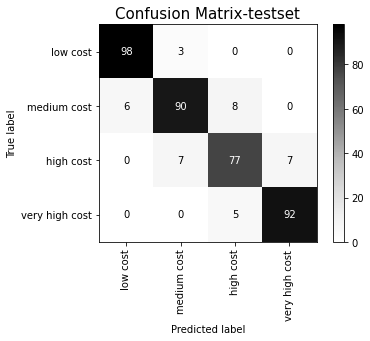

In [221]:
# plotting confusion matrix for test set.
plot_confusion_matrix(xgb_opti,X_test,y_test,cmap='Greys',display_labels=Class_cat,xticks_rotation='vertical')
plt.grid(False)
plt.title('Confusion Matrix-testset',fontsize=15)
plt.show()

In [222]:
#printing the classifiaction report of train set.
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       393
         1.0       1.00      1.00      1.00       387
         2.0       1.00      1.00      1.00       400
         3.0       1.00      1.00      1.00       389

    accuracy                           1.00      1569
   macro avg       1.00      1.00      1.00      1569
weighted avg       1.00      1.00      1.00      1569



In [223]:
#printing the classifiaction report of test set.
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96       101
         1.0       0.90      0.87      0.88       104
         2.0       0.86      0.85      0.85        91
         3.0       0.93      0.95      0.94        97

    accuracy                           0.91       393
   macro avg       0.91      0.91      0.91       393
weighted avg       0.91      0.91      0.91       393



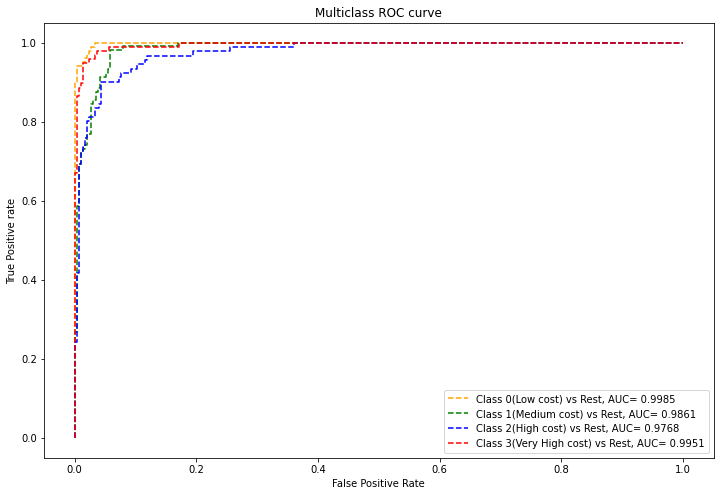

In [224]:
# Plot AUC ROC curve.
pred_prob = xgb_opti.predict_proba(X_test)
plot_Auc_roc(y_test,pred_prob)

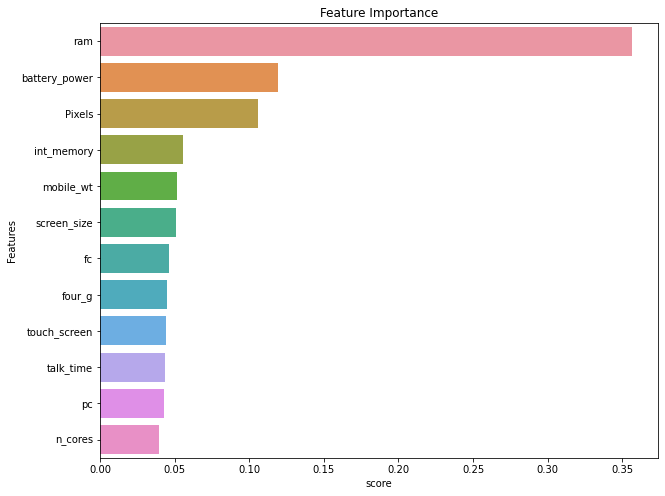

In [225]:
#plotting feature importances
plot_feature_importance(xgb_opti)

### **Observations**

***Before hyperparameter Tuning***
* ***Train Accuarcy = 98%***
* ***Test Accuarcy = 87%***

***After hyperparameter Tuning***
* ***Train Accuarcy = 100%***
* ***Test Accuarcy = 89%***

***we have improved the model performance by Hyperparamter tuning. Test accuracy is increased by 2%.But still the difference of accuracy score between train and test is  more than 10%.We can say model is slightly overfitted***

***From AUC-ROC curve its clear that model has almost correctly predicted the class 0 and class 3.***


### ML MODEL - 4

#SVM

### **with default parameters.**

In [133]:
# Import all relevant libraries

from sklearn.svm import SVC

In [134]:
svc = SVC(random_state=101)      # creating an object of classifier
svc.fit(X_train_scaled,y_train)    # fitting the model/training the model.

SVC(random_state=101)

In [135]:
# predicting the y value of train set and test set
y_train_pred=svc.predict(X_train_scaled)
y_pred=svc.predict(X_test_scaled)


In [136]:
# Accuracy score for train set
accuracy_score(y_train,y_train_pred)

0.9700446144040791

In [137]:
# Accuracy score for test set.
accuracy_score(y_test,y_pred)

0.8931297709923665

In [138]:
cf_matrix=confusion_matrix(y_test,y_pred)
cf_matrix

array([[96,  5,  0,  0],
       [ 3, 87, 14,  0],
       [ 0,  6, 82,  3],
       [ 0,  0, 11, 86]])

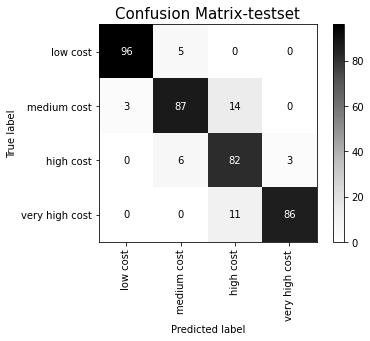

In [139]:
# plotting confusion matrix for test set.
plot_confusion_matrix(svc,X_test_scaled,y_test,cmap='Greys',display_labels=Class_cat,xticks_rotation='vertical')
plt.grid(False)
plt.title('Confusion Matrix-testset',fontsize=15)
plt.show()

In [140]:
#printing the classifiaction report of train set.
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98       393
         1.0       0.97      0.96      0.96       387
         2.0       0.94      0.97      0.96       400
         3.0       0.99      0.97      0.98       389

    accuracy                           0.97      1569
   macro avg       0.97      0.97      0.97      1569
weighted avg       0.97      0.97      0.97      1569



In [141]:
#printing the classifiaction report of train set.
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.97      0.95      0.96       101
         1.0       0.89      0.84      0.86       104
         2.0       0.77      0.90      0.83        91
         3.0       0.97      0.89      0.92        97

    accuracy                           0.89       393
   macro avg       0.90      0.89      0.89       393
weighted avg       0.90      0.89      0.89       393



### **Hyperparameter Tuning**

In [142]:
# parameter grid for GridSearchCv
grid_values = {
    'C':[0.01,0.1,1,10],
    'kernel' : ["linear","poly","rbf","sigmoid"],
    'degree' : [1,3,5,7],
    'gamma' : [0.01,1]
}

In [143]:
# creating an object for classifier
svm  = SVC ()

In [144]:
# Hyperparameter tuning with the GrdiSearhCV with cv=5
svm_cv = GridSearchCV(svm, grid_values, cv = 5,verbose=2)
svm_cv.fit(X_train_scaled,y_train)     # fitting the data into the model

Fitting 5 folds for each of 128 candidates, totalling 640 fits
[CV] END ........C=0.01, degree=1, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ........C=0.01, degree=1, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ........C=0.01, degree=1, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ........C=0.01, degree=1, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ........C=0.01, degree=1, gamma=0.01, kernel=linear; total time=   0.1s
[CV] END ..........C=0.01, degree=1, gamma=0.01, kernel=poly; total time=   0.2s
[CV] END ..........C=0.01, degree=1, gamma=0.01, kernel=poly; total time=   0.2s
[CV] END ..........C=0.01, degree=1, gamma=0.01, kernel=poly; total time=   0.2s
[CV] END ..........C=0.01, degree=1, gamma=0.01, kernel=poly; total time=   0.2s
[CV] END ..........C=0.01, degree=1, gamma=0.01, kernel=poly; total time=   0.2s
[CV] END ...........C=0.01, degree=1, gamma=0.01, kernel=rbf; total time=   0.2s
[CV] END ...........C=0.01, degree=1, gamma=0.

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.01, 0.1, 1, 10], 'degree': [1, 3, 5, 7],
                         'gamma': [0.01, 1],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             verbose=2)

In [145]:
# getting the best parameters
svm_cv.best_params_

{'C': 10, 'degree': 1, 'gamma': 0.01, 'kernel': 'linear'}

In [146]:
# getting the best estimators
svm_cv.best_estimator_

SVC(C=10, degree=1, gamma=0.01, kernel='linear')

In [147]:
# applying best parameters to the SVm model.
svm_optimal=SVC(C=10, degree=1, gamma=0.01, kernel='linear',probability=True)
svm_optimal.fit(X_train_scaled,y_train)   # fitting the data

SVC(C=10, degree=1, gamma=0.01, kernel='linear', probability=True)

In [148]:
# predicting the y values of train and test set.
y_train_pred=svm_optimal.predict(X_train_scaled)    
y_pred=svm_optimal.predict(X_test_scaled)

In [149]:
y_train_pred

array([1., 1., 2., ..., 0., 0., 1.])

In [150]:
y_pred

array([3., 0., 2., 1., 0., 1., 0., 2., 2., 3., 0., 1., 0., 3., 3., 1., 1.,
       1., 3., 2., 3., 0., 3., 0., 2., 0., 0., 3., 0., 3., 3., 3., 2., 2.,
       0., 2., 3., 2., 1., 3., 3., 3., 1., 3., 0., 0., 1., 0., 1., 3., 3.,
       3., 3., 0., 0., 2., 3., 1., 2., 0., 2., 0., 3., 0., 3., 1., 0., 1.,
       0., 3., 2., 1., 2., 0., 1., 2., 3., 0., 0., 3., 0., 1., 1., 2., 0.,
       3., 1., 2., 2., 0., 1., 1., 2., 1., 3., 1., 2., 3., 1., 3., 2., 2.,
       0., 1., 0., 1., 2., 1., 3., 2., 1., 3., 3., 1., 3., 1., 0., 1., 1.,
       0., 1., 3., 3., 0., 0., 3., 1., 2., 1., 1., 1., 0., 1., 0., 0., 1.,
       1., 2., 3., 2., 3., 2., 3., 2., 2., 1., 3., 0., 2., 1., 1., 0., 0.,
       2., 0., 1., 1., 0., 3., 0., 1., 0., 0., 2., 1., 2., 1., 0., 1., 3.,
       1., 2., 2., 1., 0., 0., 3., 2., 3., 3., 2., 2., 2., 2., 0., 0., 1.,
       1., 3., 0., 1., 1., 1., 2., 0., 3., 2., 0., 1., 2., 3., 1., 0., 2.,
       2., 3., 2., 1., 0., 2., 0., 3., 1., 3., 2., 0., 0., 0., 0., 3., 3.,
       0., 2., 1., 3., 3.

In [151]:
# checkig the accuracy score of train set.
accuracy_score(y_train,y_train_pred)

0.9464627151051626

In [152]:
# checking the accuracy of test data
accuracy_score(y_test,y_pred)

0.9465648854961832

In [154]:
# Confusion matrix
cf_matrix=confusion_matrix(y_test,y_pred)
cf_matrix

array([[99,  2,  0,  0],
       [ 2, 98,  4,  0],
       [ 0,  3, 81,  7],
       [ 0,  0,  3, 94]])

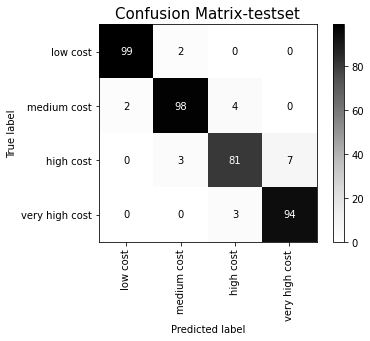

In [155]:
# plotting confusion matrix for test set.
plot_confusion_matrix(svm_optimal,X_test_scaled,y_test,cmap='Greys',display_labels=Class_cat,xticks_rotation='vertical')
plt.grid(False)
plt.title('Confusion Matrix-testset',fontsize=15)
plt.show()

In [156]:
#printing the classifiaction report of train set.
print(classification_report(y_train,y_train_pred))

              precision    recall  f1-score   support

         0.0       0.97      0.98      0.97       393
         1.0       0.92      0.92      0.92       387
         2.0       0.93      0.92      0.92       400
         3.0       0.96      0.97      0.97       389

    accuracy                           0.95      1569
   macro avg       0.95      0.95      0.95      1569
weighted avg       0.95      0.95      0.95      1569



In [157]:
#printing the classifiaction report of train set.
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       101
         1.0       0.95      0.94      0.95       104
         2.0       0.92      0.89      0.91        91
         3.0       0.93      0.97      0.95        97

    accuracy                           0.95       393
   macro avg       0.95      0.95      0.95       393
weighted avg       0.95      0.95      0.95       393



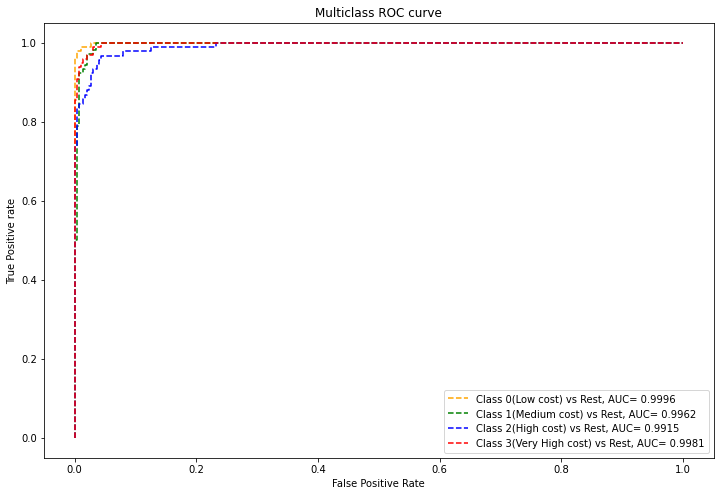

In [158]:
# Plot AUC ROC curve.
pred_prob = svm_optimal.predict_proba(X_test_scaled)
plot_Auc_roc(y_test,pred_prob)

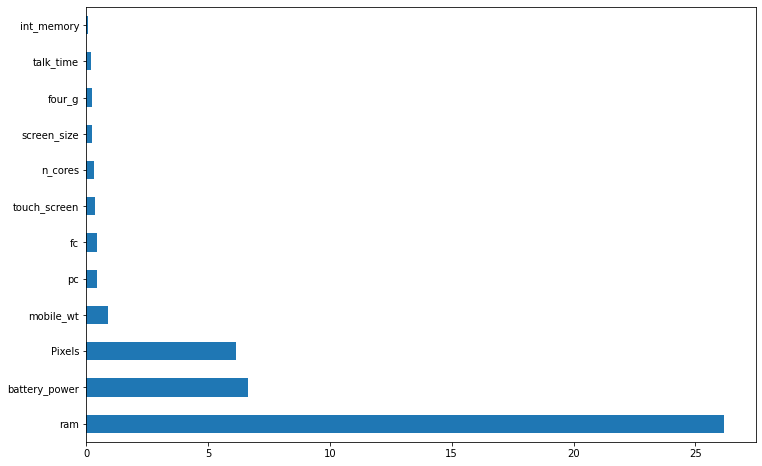

In [159]:
plt.figure(figsize=(12,8))
pd.Series(abs(svm_optimal.coef_[0])+abs(svm_optimal.coef_[1])+abs(svm_optimal.coef_[2])+abs(svm_optimal.coef_[3]), index=X_train.columns).nlargest(12).plot(kind='barh')

### **Observations**


* ***Before hyperparameter tuning Accuracy score on train set is 97% and Test score is 89%.***
***Model seems to be overfitted as the differance between train and test accuracy score is almot 10%.***
* ***After Hyperparameter tuning train accuracy remained almost same  94% and test accuracy score increased to 94%.*** 
*  ***SVM performed very well as compared to other alogorithms.***
* ***In terms of feature importance RAM,Battery power,px_height and px_weight are the imporatant features.***

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

Logistic Regression and SVM performs best. Random forest and XG Boost performs almost similar

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

Answer Here.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

* From EDA we can see that, there are mobile phones in 4 price ranges.
which are similarly divided.

* Half the devices have Bluetooth, and half don’t.

* There is a gradual increase in battery as the price range increases.

* Ram has continuous increase with price range while moving from Low cost to Very high cost.

* Costly phones are lighter.

* RAM, battery power, pixels played more significant role in deciding the price range of mobile phone.

I have implemented 4 classification models and achieved a fairly good result for all the algorithms.

* Logistic Regression
* Random Forest
* XG Boost
* SVM

* Logistic regression and SVM shows approx accuracy of 95% and the other two shows approx 90% accuracy, which shows that the data were properly classified.

* Logistic Regression and SVM performed better than the other two model.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***